# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize

import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
# helper scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    min_val, max_val = feature_range
    x = x * (max_val - min_val) + min_val
    return x


def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [ToTensor(),
                 Resize((size[0], size[1])),
                 scale]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
import os
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.transforms = transforms
        self.dir = directory
        self.ext = extension
        self.files = []
        for file in os.listdir(self.dir):
            if file.endswith(self.ext):
                self.files.append(file)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.files)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        img_path = self.dir + self.files[index]
        image = plt.imread(img_path)
        if self.transforms:
            image = self.transforms(image)
        return image


In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


/opt/conda/lib/python3.7/site-packages/torchvision/transforms/functional.py:114: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ../torch/csrc/utils/tensor_numpy.cpp:178.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


The functions below will help you visualize images from the dataset.

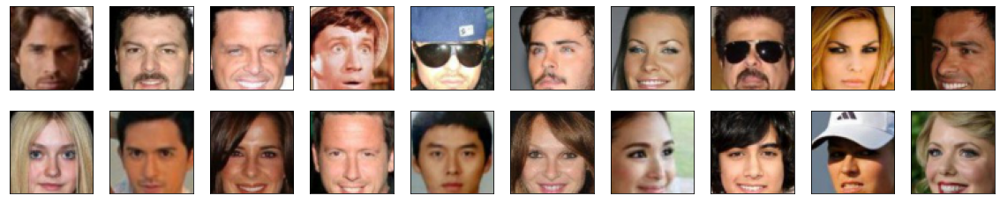

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
import torch.nn as nn
from torch.nn import Module

In [9]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [10]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        conv_dim = 64
        self.z_size = 100
        
        # 64 x 64 input
        self.conv1 = ConvBlock(3, conv_dim, 4, batch_norm = False)
        # 32 x 32 output
        
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4)
        # 16 x 16 output
        
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4)
        # 8 x 8 output
        self.conv4 = ConvBlock(conv_dim*4, conv_dim*8, 4)
        # 4 x 4 output
        
        self.flatten = nn.Flatten()
        
        self.fc = nn.Linear(conv_dim*8*4*4, 1)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # all hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        
        # flatten
        x = self.flatten(x)
        # final output layer
        x = self.fc(x)
        return x 

### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [11]:
class DeconvBlock(Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [12]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # transpose conv layers
        conv_dim = 64
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*8, 4, 1, 0)
        self.deconv2 = DeconvBlock(conv_dim*8, conv_dim*4, 4, 2, 1)
        self.deconv3 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.deconv4 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        x = self.last_activation(x)
        return x

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 0.0002
    beta1 = 0.5
    beta2 = 0.999
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

In [16]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    loss = real_loss(fake_logits)
    
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [17]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    d_real_loss = real_loss(real_logits)
    d_fake_loss = fake_loss(fake_logits)
    loss = d_real_loss + d_fake_loss
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [18]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # sample a random point between both distributions
    alpha = torch.rand(real_samples.shape)
    if train_on_gpu:
        alpha = alpha.cuda()
    
    x_hat = alpha * real_samples + (1-alpha) * fake_samples
    
    # calculate the gradient
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat, grad_outputs=torch.ones_like(pred), create_graph=True)[0]
    
    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1) ** 2).mean()
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [19]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    g_optimizer.zero_grad()
    
    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    if train_on_gpu:
        z = z.cuda()

    fake_images = generator(z)
    
    # Compute the discriminator losses on fake images
    fake_logits = discriminator(fake_images)
    g_loss = generator_loss(fake_logits)
    
    # perform backprop
    g_loss.backward()
    g_optimizer.step()
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    
    if train_on_gpu:
        real_images = real_images.cuda()
    
    real_logits = discriminator(real_images)
    
    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    # move x to GPU, if available
    if train_on_gpu:
        z = z.cuda()
    fake_images = generator(z)

    # Compute the discriminator losses on fake images            
    fake_logits = discriminator(fake_images.detach())
    
    d_loss = discriminator_loss(real_logits, fake_logits)
    d_loss.backward()
    d_optimizer.step()
    
    gp = gradient_penalty(discriminator, real_images, fake_images)
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [20]:
from datetime import datetime

In [21]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 10

# number of images in each batch
batch_size = 64

train_on_gpu = True

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [23]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-02-13 04:48:33 | Epoch [1/10] | Batch 0/509 | d_loss: 1.3006 | g_loss: 1.9124
2023-02-13 04:48:50 | Epoch [1/10] | Batch 50/509 | d_loss: 0.0042 | g_loss: 11.5042
2023-02-13 04:49:07 | Epoch [1/10] | Batch 100/509 | d_loss: 2.0682 | g_loss: 7.1404
2023-02-13 04:49:24 | Epoch [1/10] | Batch 150/509 | d_loss: 0.6063 | g_loss: 4.2789
2023-02-13 04:49:42 | Epoch [1/10] | Batch 200/509 | d_loss: 0.1974 | g_loss: 4.8725
2023-02-13 04:49:59 | Epoch [1/10] | Batch 250/509 | d_loss: 0.5500 | g_loss: 3.7669
2023-02-13 04:50:16 | Epoch [1/10] | Batch 300/509 | d_loss: 0.4436 | g_loss: 3.6704
2023-02-13 04:50:33 | Epoch [1/10] | Batch 350/509 | d_loss: 0.4301 | g_loss: 2.8815
2023-02-13 04:50:50 | Epoch [1/10] | Batch 400/509 | d_loss: 1.0285 | g_loss: 2.6926
2023-02-13 04:51:07 | Epoch [1/10] | Batch 450/509 | d_loss: 0.3079 | g_loss: 2.6803
2023-02-13 04:51:24 | Epoch [1/10] | Batch 500/509 | d_loss: 0.3498 | g_loss: 1.7625


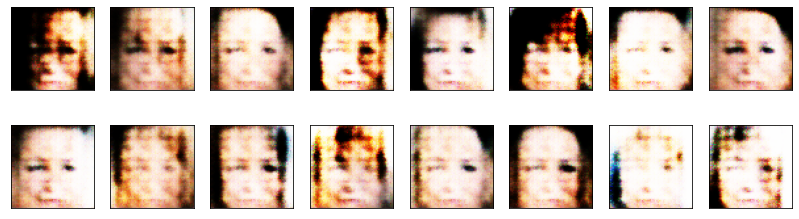

2023-02-13 04:51:28 | Epoch [2/10] | Batch 0/509 | d_loss: 0.8433 | g_loss: 6.8357
2023-02-13 04:51:45 | Epoch [2/10] | Batch 50/509 | d_loss: 0.6110 | g_loss: 2.2995
2023-02-13 04:52:02 | Epoch [2/10] | Batch 100/509 | d_loss: 0.5838 | g_loss: 4.4644
2023-02-13 04:52:19 | Epoch [2/10] | Batch 150/509 | d_loss: 0.5203 | g_loss: 5.0391
2023-02-13 04:52:36 | Epoch [2/10] | Batch 200/509 | d_loss: 0.3216 | g_loss: 3.4047
2023-02-13 04:52:53 | Epoch [2/10] | Batch 250/509 | d_loss: 0.2233 | g_loss: 4.5645
2023-02-13 04:53:10 | Epoch [2/10] | Batch 300/509 | d_loss: 0.6477 | g_loss: 4.8540
2023-02-13 04:53:27 | Epoch [2/10] | Batch 350/509 | d_loss: 0.6234 | g_loss: 3.5729
2023-02-13 04:53:44 | Epoch [2/10] | Batch 400/509 | d_loss: 0.5420 | g_loss: 2.9059
2023-02-13 04:54:01 | Epoch [2/10] | Batch 450/509 | d_loss: 0.5869 | g_loss: 5.4834
2023-02-13 04:54:18 | Epoch [2/10] | Batch 500/509 | d_loss: 0.4845 | g_loss: 9.2366


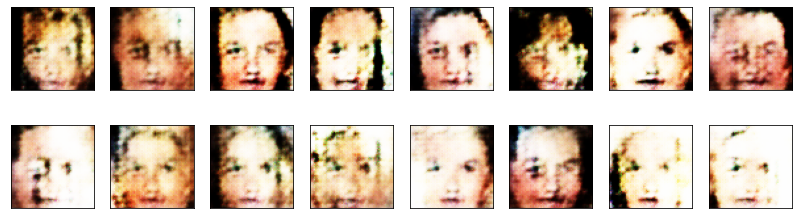

2023-02-13 04:54:22 | Epoch [3/10] | Batch 0/509 | d_loss: 0.4407 | g_loss: 2.7700
2023-02-13 04:54:39 | Epoch [3/10] | Batch 50/509 | d_loss: 0.5099 | g_loss: 3.7490
2023-02-13 04:54:56 | Epoch [3/10] | Batch 100/509 | d_loss: 1.2128 | g_loss: 7.0400
2023-02-13 04:55:13 | Epoch [3/10] | Batch 150/509 | d_loss: 0.5561 | g_loss: 6.3924
2023-02-13 04:55:30 | Epoch [3/10] | Batch 200/509 | d_loss: 0.3823 | g_loss: 4.6777
2023-02-13 04:55:47 | Epoch [3/10] | Batch 250/509 | d_loss: 1.1725 | g_loss: 2.5867
2023-02-13 04:56:04 | Epoch [3/10] | Batch 300/509 | d_loss: 0.4135 | g_loss: 3.6083
2023-02-13 04:56:21 | Epoch [3/10] | Batch 350/509 | d_loss: 0.3388 | g_loss: 3.3296
2023-02-13 04:56:38 | Epoch [3/10] | Batch 400/509 | d_loss: 0.4666 | g_loss: 4.2159
2023-02-13 04:56:55 | Epoch [3/10] | Batch 450/509 | d_loss: 0.5586 | g_loss: 5.0759
2023-02-13 04:57:12 | Epoch [3/10] | Batch 500/509 | d_loss: 0.8121 | g_loss: 6.2119


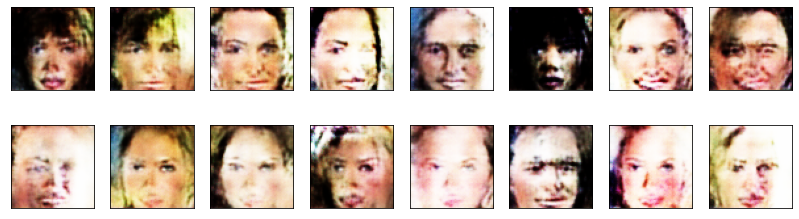

2023-02-13 04:57:17 | Epoch [4/10] | Batch 0/509 | d_loss: 0.4742 | g_loss: 2.8512
2023-02-13 04:57:34 | Epoch [4/10] | Batch 50/509 | d_loss: 0.6125 | g_loss: 5.7348
2023-02-13 04:57:51 | Epoch [4/10] | Batch 100/509 | d_loss: 0.4182 | g_loss: 3.4456
2023-02-13 04:58:08 | Epoch [4/10] | Batch 150/509 | d_loss: 0.3761 | g_loss: 3.4965
2023-02-13 04:58:25 | Epoch [4/10] | Batch 200/509 | d_loss: 0.2642 | g_loss: 3.7710
2023-02-13 04:58:42 | Epoch [4/10] | Batch 250/509 | d_loss: 0.2093 | g_loss: 2.9579
2023-02-13 04:58:59 | Epoch [4/10] | Batch 300/509 | d_loss: 0.1203 | g_loss: 2.5293
2023-02-13 04:59:16 | Epoch [4/10] | Batch 350/509 | d_loss: 0.2524 | g_loss: 4.3112
2023-02-13 04:59:33 | Epoch [4/10] | Batch 400/509 | d_loss: 0.3979 | g_loss: 2.7540
2023-02-13 04:59:50 | Epoch [4/10] | Batch 450/509 | d_loss: 0.1149 | g_loss: 4.6884
2023-02-13 05:00:07 | Epoch [4/10] | Batch 500/509 | d_loss: 0.4696 | g_loss: 3.4085


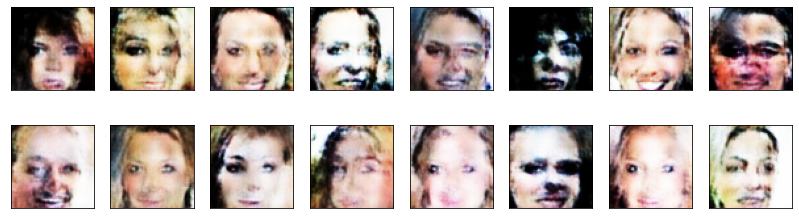

2023-02-13 05:00:11 | Epoch [5/10] | Batch 0/509 | d_loss: 0.6847 | g_loss: 5.3400
2023-02-13 05:00:28 | Epoch [5/10] | Batch 50/509 | d_loss: 3.5964 | g_loss: 1.7003
2023-02-13 05:00:45 | Epoch [5/10] | Batch 100/509 | d_loss: 0.5341 | g_loss: 4.9663
2023-02-13 05:01:02 | Epoch [5/10] | Batch 150/509 | d_loss: 0.2412 | g_loss: 3.9631
2023-02-13 05:01:19 | Epoch [5/10] | Batch 200/509 | d_loss: 0.3507 | g_loss: 2.4832
2023-02-13 05:01:36 | Epoch [5/10] | Batch 250/509 | d_loss: 0.3236 | g_loss: 3.5445
2023-02-13 05:01:53 | Epoch [5/10] | Batch 300/509 | d_loss: 0.2472 | g_loss: 3.4443
2023-02-13 05:02:11 | Epoch [5/10] | Batch 350/509 | d_loss: 0.2404 | g_loss: 4.0350
2023-02-13 05:02:28 | Epoch [5/10] | Batch 400/509 | d_loss: 0.3781 | g_loss: 4.0295
2023-02-13 05:02:45 | Epoch [5/10] | Batch 450/509 | d_loss: 0.3236 | g_loss: 3.1386
2023-02-13 05:03:02 | Epoch [5/10] | Batch 500/509 | d_loss: 0.5318 | g_loss: 2.7438


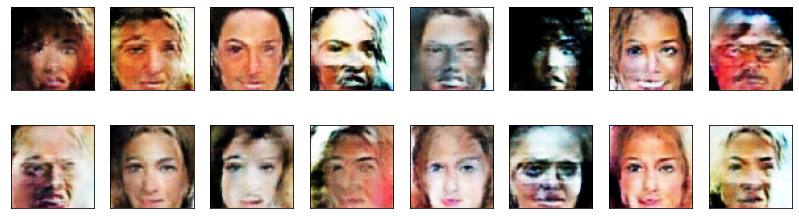

2023-02-13 05:03:06 | Epoch [6/10] | Batch 0/509 | d_loss: 0.3290 | g_loss: 3.6090
2023-02-13 05:03:23 | Epoch [6/10] | Batch 50/509 | d_loss: 0.3145 | g_loss: 3.8525
2023-02-13 05:03:40 | Epoch [6/10] | Batch 100/509 | d_loss: 0.5639 | g_loss: 2.2489
2023-02-13 05:03:57 | Epoch [6/10] | Batch 150/509 | d_loss: 1.6164 | g_loss: 4.5697
2023-02-13 05:04:14 | Epoch [6/10] | Batch 200/509 | d_loss: 0.2668 | g_loss: 3.8101
2023-02-13 05:04:31 | Epoch [6/10] | Batch 250/509 | d_loss: 0.2626 | g_loss: 3.3048
2023-02-13 05:04:48 | Epoch [6/10] | Batch 300/509 | d_loss: 0.3646 | g_loss: 4.3443
2023-02-13 05:05:05 | Epoch [6/10] | Batch 350/509 | d_loss: 0.7883 | g_loss: 8.2426
2023-02-13 05:05:22 | Epoch [6/10] | Batch 400/509 | d_loss: 0.3222 | g_loss: 1.8411
2023-02-13 05:05:39 | Epoch [6/10] | Batch 450/509 | d_loss: 0.1338 | g_loss: 4.4123
2023-02-13 05:05:56 | Epoch [6/10] | Batch 500/509 | d_loss: 0.4019 | g_loss: 2.9317


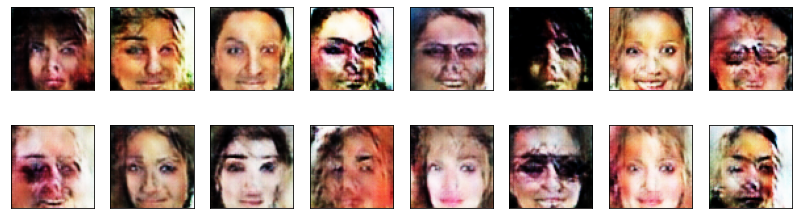

2023-02-13 05:06:01 | Epoch [7/10] | Batch 0/509 | d_loss: 0.3330 | g_loss: 3.7780
2023-02-13 05:06:18 | Epoch [7/10] | Batch 50/509 | d_loss: 0.4185 | g_loss: 3.6257
2023-02-13 05:06:35 | Epoch [7/10] | Batch 100/509 | d_loss: 0.3063 | g_loss: 2.6621
2023-02-13 05:06:52 | Epoch [7/10] | Batch 150/509 | d_loss: 0.1602 | g_loss: 1.7707
2023-02-13 05:07:09 | Epoch [7/10] | Batch 200/509 | d_loss: 0.3929 | g_loss: 2.3706
2023-02-13 05:07:26 | Epoch [7/10] | Batch 250/509 | d_loss: 0.5339 | g_loss: 4.1352
2023-02-13 05:07:43 | Epoch [7/10] | Batch 300/509 | d_loss: 2.1164 | g_loss: 3.2512
2023-02-13 05:08:00 | Epoch [7/10] | Batch 350/509 | d_loss: 0.1733 | g_loss: 2.9796
2023-02-13 05:08:17 | Epoch [7/10] | Batch 400/509 | d_loss: 0.3711 | g_loss: 3.5189
2023-02-13 05:08:34 | Epoch [7/10] | Batch 450/509 | d_loss: 0.3766 | g_loss: 5.4644
2023-02-13 05:08:51 | Epoch [7/10] | Batch 500/509 | d_loss: 0.2858 | g_loss: 1.7968


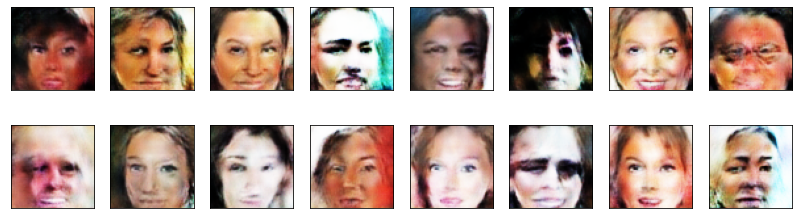

2023-02-13 05:08:55 | Epoch [8/10] | Batch 0/509 | d_loss: 0.6252 | g_loss: 6.2128
2023-02-13 05:09:12 | Epoch [8/10] | Batch 50/509 | d_loss: 0.3666 | g_loss: 4.2924
2023-02-13 05:09:29 | Epoch [8/10] | Batch 100/509 | d_loss: 0.2440 | g_loss: 3.9573
2023-02-13 05:09:46 | Epoch [8/10] | Batch 150/509 | d_loss: 0.3638 | g_loss: 1.5977
2023-02-13 05:10:03 | Epoch [8/10] | Batch 200/509 | d_loss: 0.1249 | g_loss: 3.2839
2023-02-13 05:10:20 | Epoch [8/10] | Batch 250/509 | d_loss: 0.3118 | g_loss: 3.7361
2023-02-13 05:10:37 | Epoch [8/10] | Batch 300/509 | d_loss: 0.3128 | g_loss: 6.5354
2023-02-13 05:10:55 | Epoch [8/10] | Batch 350/509 | d_loss: 0.1487 | g_loss: 3.1000
2023-02-13 05:11:12 | Epoch [8/10] | Batch 400/509 | d_loss: 0.2192 | g_loss: 6.8684
2023-02-13 05:11:29 | Epoch [8/10] | Batch 450/509 | d_loss: 0.2175 | g_loss: 3.4418
2023-02-13 05:11:46 | Epoch [8/10] | Batch 500/509 | d_loss: 0.2205 | g_loss: 2.7899


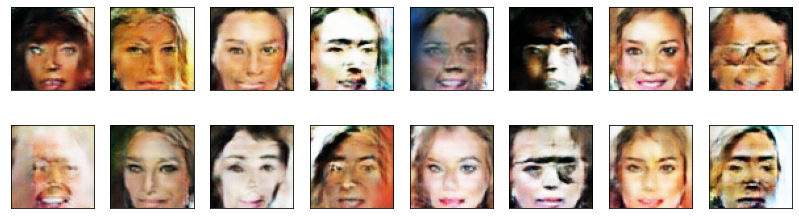

2023-02-13 05:11:50 | Epoch [9/10] | Batch 0/509 | d_loss: 0.9409 | g_loss: 8.3670
2023-02-13 05:12:07 | Epoch [9/10] | Batch 50/509 | d_loss: 0.2048 | g_loss: 3.9159
2023-02-13 05:12:24 | Epoch [9/10] | Batch 100/509 | d_loss: 0.6436 | g_loss: 7.1539
2023-02-13 05:12:41 | Epoch [9/10] | Batch 150/509 | d_loss: 0.3802 | g_loss: 2.7091
2023-02-13 05:12:58 | Epoch [9/10] | Batch 200/509 | d_loss: 0.2454 | g_loss: 2.4679
2023-02-13 05:13:15 | Epoch [9/10] | Batch 250/509 | d_loss: 0.1459 | g_loss: 3.5633
2023-02-13 05:13:32 | Epoch [9/10] | Batch 300/509 | d_loss: 0.6403 | g_loss: 5.2597
2023-02-13 05:13:49 | Epoch [9/10] | Batch 350/509 | d_loss: 0.5443 | g_loss: 9.2788
2023-02-13 05:14:06 | Epoch [9/10] | Batch 400/509 | d_loss: 0.2312 | g_loss: 4.4214
2023-02-13 05:14:23 | Epoch [9/10] | Batch 450/509 | d_loss: 0.0410 | g_loss: 5.0968
2023-02-13 05:14:40 | Epoch [9/10] | Batch 500/509 | d_loss: 0.1573 | g_loss: 2.9534


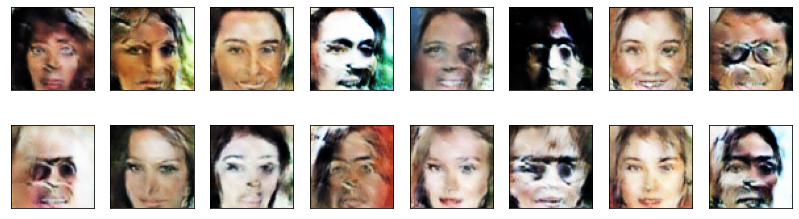

2023-02-13 05:14:45 | Epoch [10/10] | Batch 0/509 | d_loss: 0.5111 | g_loss: 6.2742
2023-02-13 05:15:02 | Epoch [10/10] | Batch 50/509 | d_loss: 0.1135 | g_loss: 4.0844
2023-02-13 05:15:19 | Epoch [10/10] | Batch 100/509 | d_loss: 0.1718 | g_loss: 4.4697
2023-02-13 05:15:36 | Epoch [10/10] | Batch 150/509 | d_loss: 0.0377 | g_loss: 3.8177
2023-02-13 05:15:53 | Epoch [10/10] | Batch 200/509 | d_loss: 0.0920 | g_loss: 2.8722
2023-02-13 05:16:10 | Epoch [10/10] | Batch 250/509 | d_loss: 0.0396 | g_loss: 4.0901
2023-02-13 05:16:27 | Epoch [10/10] | Batch 300/509 | d_loss: 0.7781 | g_loss: 2.1707
2023-02-13 05:16:44 | Epoch [10/10] | Batch 350/509 | d_loss: 0.0389 | g_loss: 5.7556
2023-02-13 05:17:01 | Epoch [10/10] | Batch 400/509 | d_loss: 1.8119 | g_loss: 8.2145
2023-02-13 05:17:18 | Epoch [10/10] | Batch 450/509 | d_loss: 0.2802 | g_loss: 3.5652
2023-02-13 05:17:35 | Epoch [10/10] | Batch 500/509 | d_loss: 0.1949 | g_loss: 3.5146


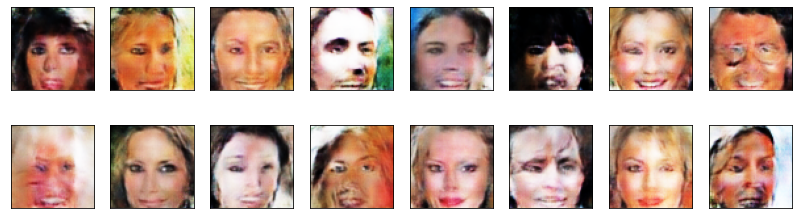

In [24]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        g_loss = generator_step(batch_size, latent_dim)       
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

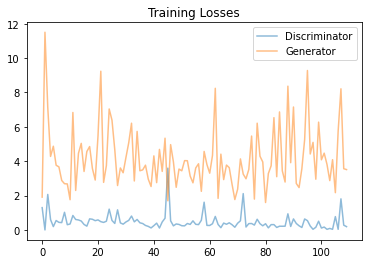

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** I could improve model performance changing loss function to use Wasserstein loss. Adding more non-white people in the dataset also could improve performance of the model by reducing bias. Changing loss or changing structure of the model may lead to more successive model because it seems that vanishing gradient occurs since the discriminator loss reaches zero and the generator's loss is still high.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.